# Import

In [229]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [230]:
def p(*obj):
    for o in obj:
        print(o)

def d(*obj):
    for o in obj:
        display(o)

def r(x, unit=3):
    return round(x, unit)

def timestamp2str(x):
    return str(x).split(' ')[0]

# 0, Data reading

Config

In [231]:
# Config

start_year = 2000

In [232]:
# Read the data
df_new = pd.read_csv('Data (Clean)/CSV/RML New Loans.csv').drop(columns=['IDX'])
df_new = df_new.loc[df_new['Year']>=start_year]

In [233]:
# Add the datetime datatype
ds_date = pd.to_datetime(df_new[['Year', 'Month']].assign(day=1)) + pd.offsets.MonthEnd()
df_new.insert(0, 'Date', ds_date)

In [234]:
d(df_new.tail(), df_new.dtypes)

,Date,Year,Month,Quarter,Applications Number,Approved Number,Approved Value,Average LTV,Average Contractual Life (Month),Drawn Down Number,Drawn Down Value,Not Yet Drawn Down Number,Not Yet Drawn Down Value
325,2023-07-31,2023,7,3,8086.0,5754,28076,53.3,326.0,5401,26326,5243,25673
326,2023-08-31,2023,8,3,8617.0,7042,35623,54.7,323.0,4389,20917,6385,32454
327,2023-09-30,2023,9,3,8787.0,5130,25516,54.5,323.0,4164,20096,4702,23608
328,2023-10-31,2023,10,4,5359.0,5016,24944,55.2,326.0,4054,20204,4613,22938
329,2023-11-30,2023,11,4,6000.0,5124,24530,57.1,326.0,3384,16150,4806,23206


Date                                datetime64[ns]
Year                                         int64
Month                                        int64
Quarter                                      int64
Applications Number                        float64
Approved Number                              int64
Approved Value                               int64
Average LTV                                float64
Average Contractual Life (Month)           float64
Drawn Down Number                            int64
Drawn Down Value                             int64
Not Yet Drawn Down Number                    int64
Not Yet Drawn Down Value                     int64
dtype: object

# 1, Descriptive analysis

In [235]:
df_new['Approved Percentage'] = (df_new['Approved Number'] / df_new['Applications Number']) * 100

In [269]:
d(df_new.tail())

cols_new = ['Applications Number', 'Approved Number', 'Approved Percentage', 'Approved Value', 'Average LTV', 'Average Contractual Life (Month)',
                    'Drawn Down Number', 'Not Yet Drawn Down Number']
describe_df = df_new[cols_new].dropna().describe()
round(describe_df, 2)

,Date,Year,Month,Quarter,Applications Number,Approved Number,Approved Value,Average LTV,Average Contractual Life (Month),Drawn Down Number,Drawn Down Value,Not Yet Drawn Down Number,Not Yet Drawn Down Value,Approved Percentage,year_quarter
325,2023-07-31,2023,7,3,8086.0,5754,28076,53.3,326.0,5401,26326,5243,25673,71.160030,2023_Q3
326,2023-08-31,2023,8,3,8617.0,7042,35623,54.7,323.0,4389,20917,6385,32454,81.722177,2023_Q3
327,2023-09-30,2023,9,3,8787.0,5130,25516,54.5,323.0,4164,20096,4702,23608,58.381700,2023_Q3
328,2023-10-31,2023,10,4,5359.0,5016,24944,55.2,326.0,4054,20204,4613,22938,93.599552,2023_Q4
329,2023-11-30,2023,11,4,6000.0,5124,24530,57.1,326.0,3384,16150,4806,23206,85.400000,2023_Q4


,Applications Number,Approved Number,Approved Percentage,Approved Value,Average LTV,Average Contractual Life (Month),Drawn Down Number,Not Yet Drawn Down Number
count,84.00,84.00,84.00,84.00,84.00,84.00,84.00,84.00
mean,11561.71,8465.64,74.32,37804.04,52.80,324.92,6309.20,7276.80
std,2919.45,1906.34,9.65,8996.64,4.66,5.89,1582.87,1592.70
min,5359.00,5016.00,57.89,23863.00,44.30,312.00,3384.00,4613.00
25%,9492.00,7160.50,68.04,30588.00,48.20,319.75,5122.00,6175.50
50%,11357.50,8056.00,73.27,37152.50,54.35,326.00,6180.50,7022.50
75%,13853.50,10054.50,80.37,44396.25,57.02,330.00,7610.25,8609.25
max,18254.00,12262.00,98.99,58381.00,60.80,336.00,9841.00,10323.00


## Distribution

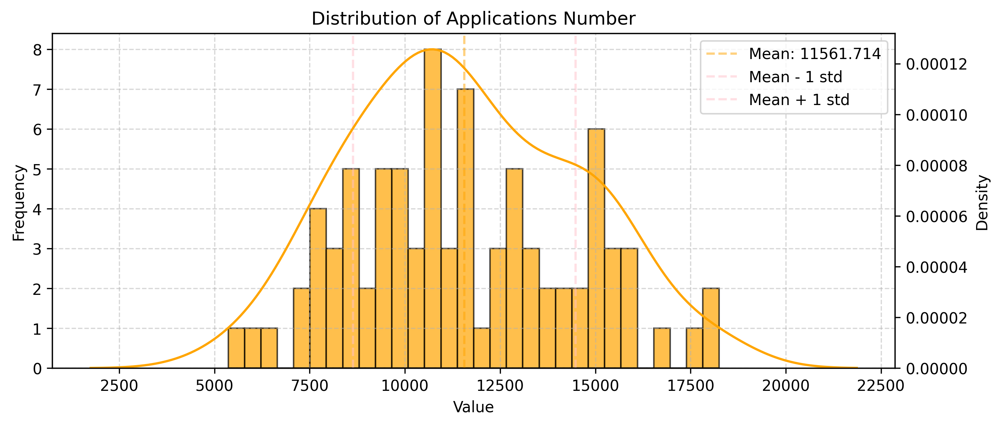

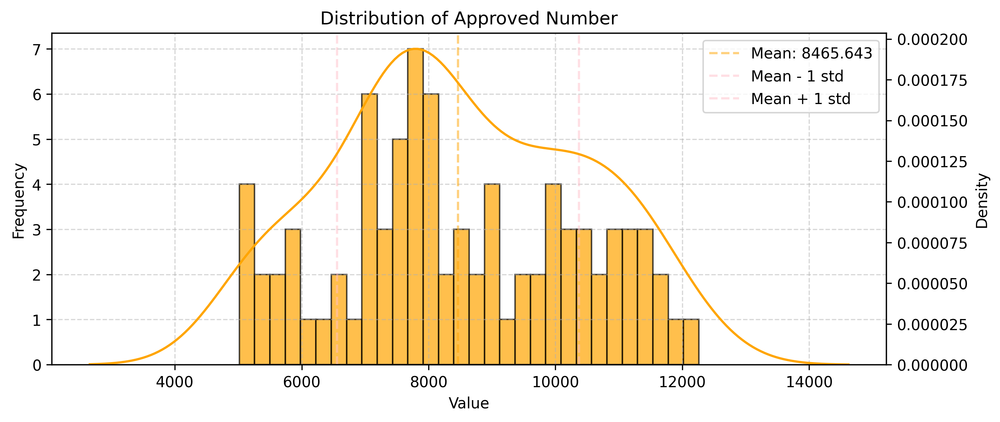

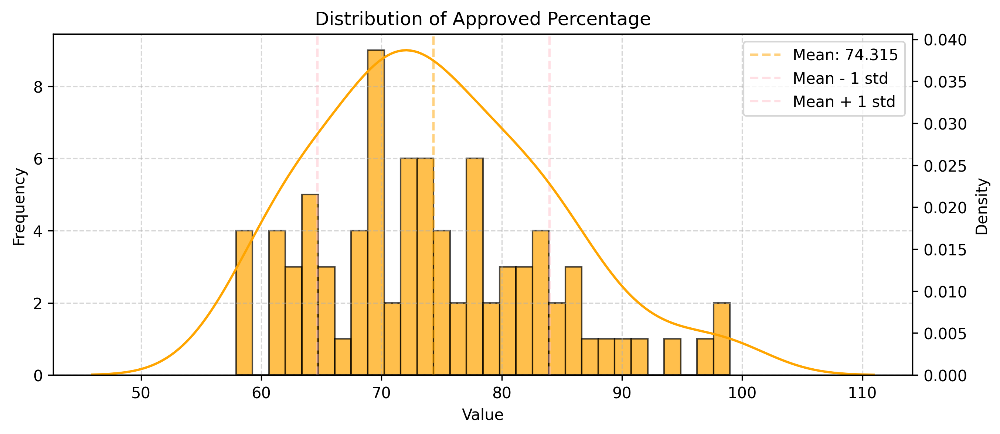

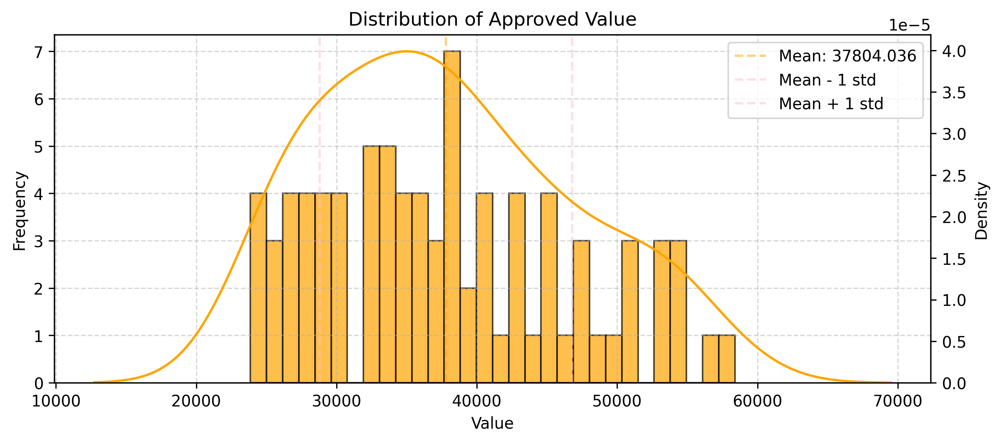

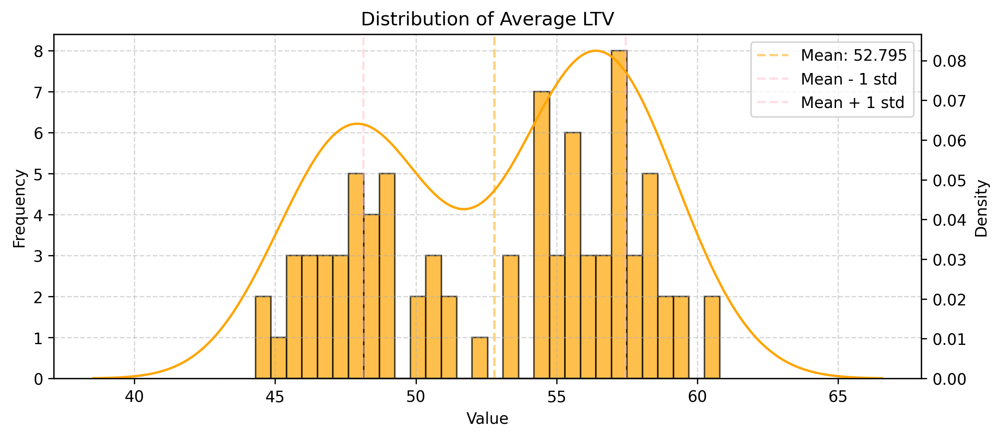

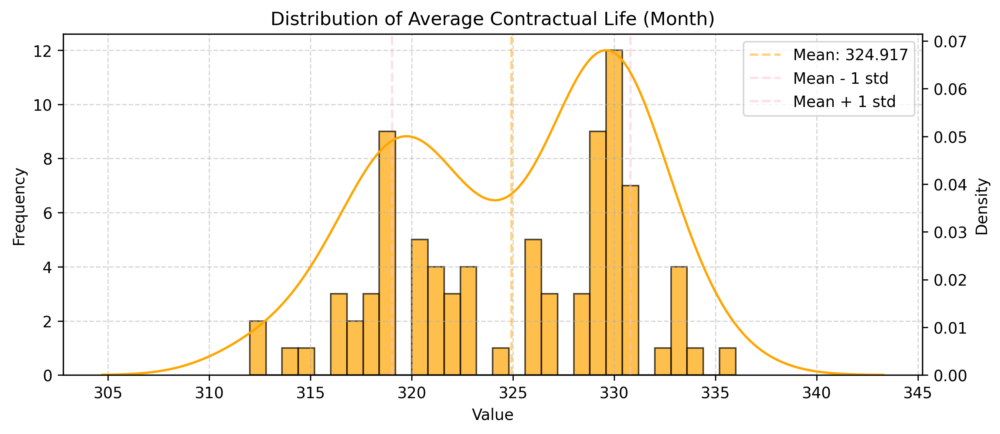

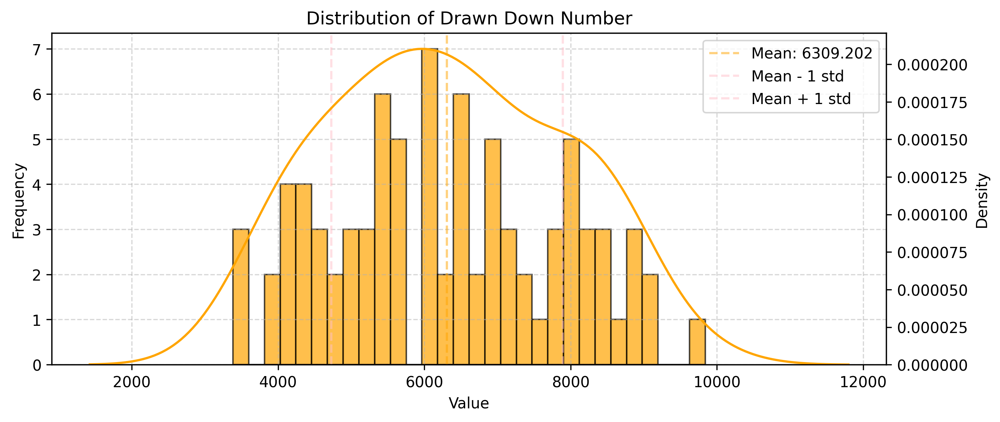

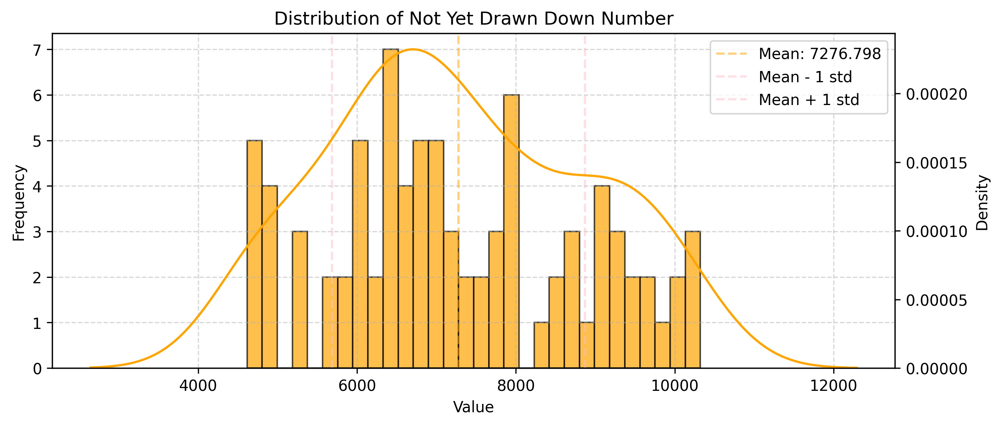

In [270]:
color = 'orange'
this_df_new = df_new.dropna()

for i, col in enumerate(cols_new):
    
    fig, ax1 = plt.subplots(figsize=(10, 4), dpi=300)
    ax2 = ax1.twinx()  # Create a twin axis for the KDE plot

    # Plot histogram with colormap
    n, bins, patches = ax1.hist(this_df_new[col], bins=30, alpha=0.7, color=color, edgecolor='black')

    # Plot KDE plot
    sns.kdeplot(this_df_new[col], color=color, ax=ax2)

    # Set labels and title
    ax1.set_xlabel('Value')
    ax1.set_ylabel('Frequency')
    ax2.set_ylabel('Density')
    this_col = col
    ax1.set_title(f'Distribution of {this_col}')

    # Add gridlines for the histogram
    ax1.grid(True, linestyle='--', alpha=0.5)

    # Add a vertical line for mean and +- 1 standard deviation
    this_mean = this_df_new[col].mean()
    this_std = this_df_new[col].std()
    ax1.axvline(this_mean, color='orange', linestyle='--', label=f'Mean: {r(this_mean)}', alpha=0.5)
    ax1.axvline(this_mean - this_std, color='pink', linestyle='--', label='Mean - 1 std', alpha=0.5)
    ax1.axvline(this_mean + this_std, color='pink', linestyle='--', label='Mean + 1 std', alpha=0.5)

    ax1.legend()
    plt.show()

## Trend

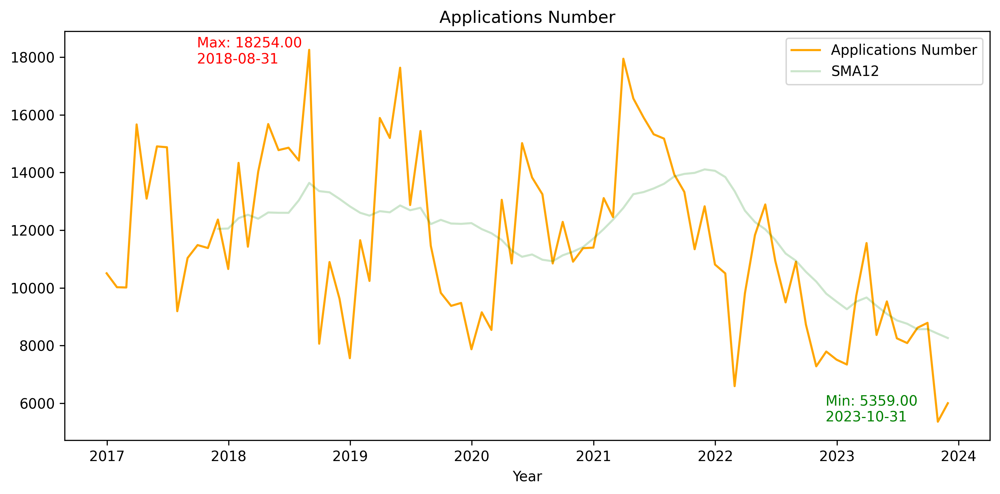

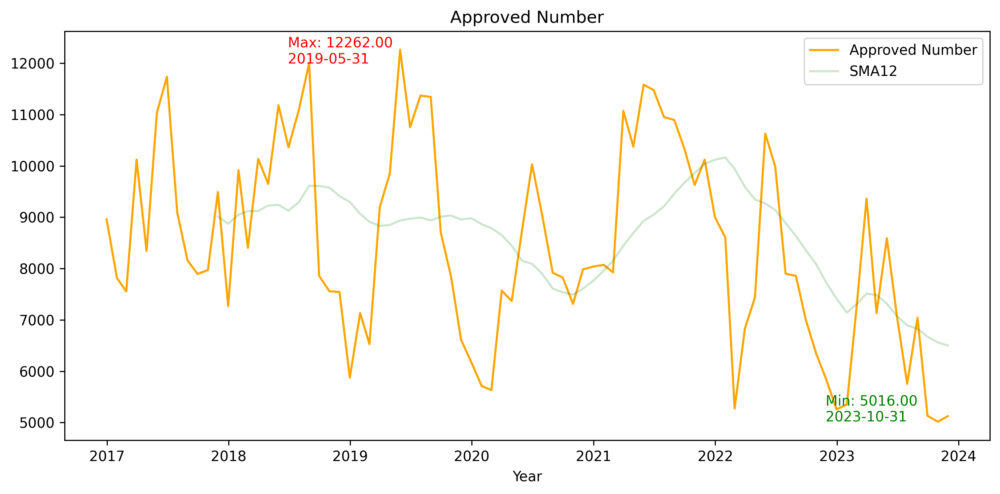

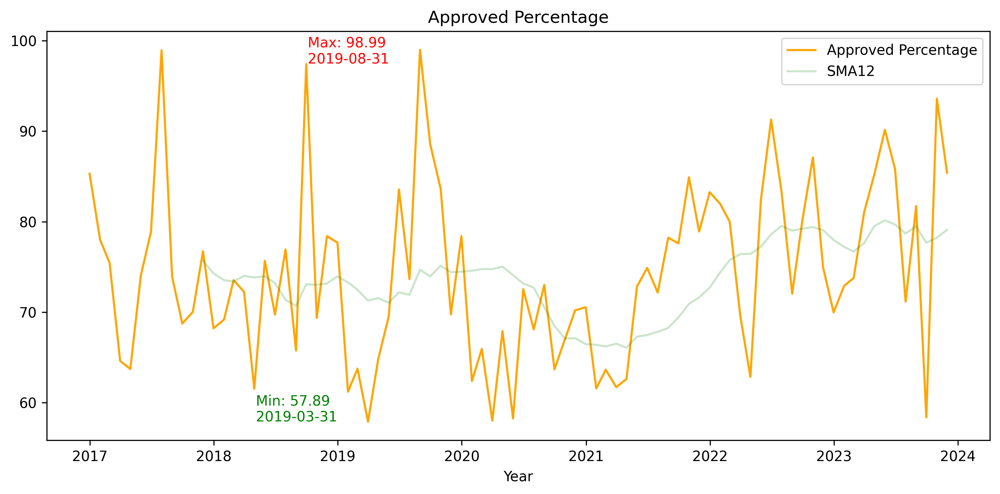

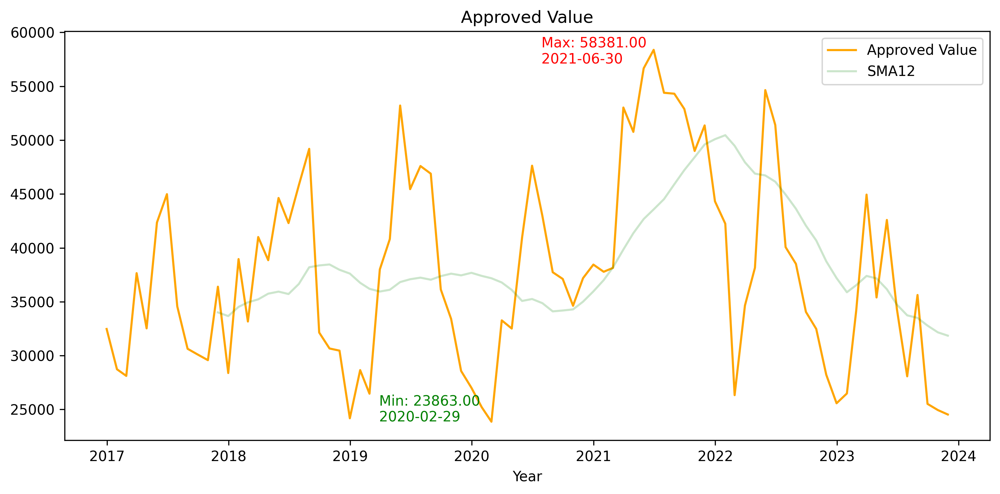

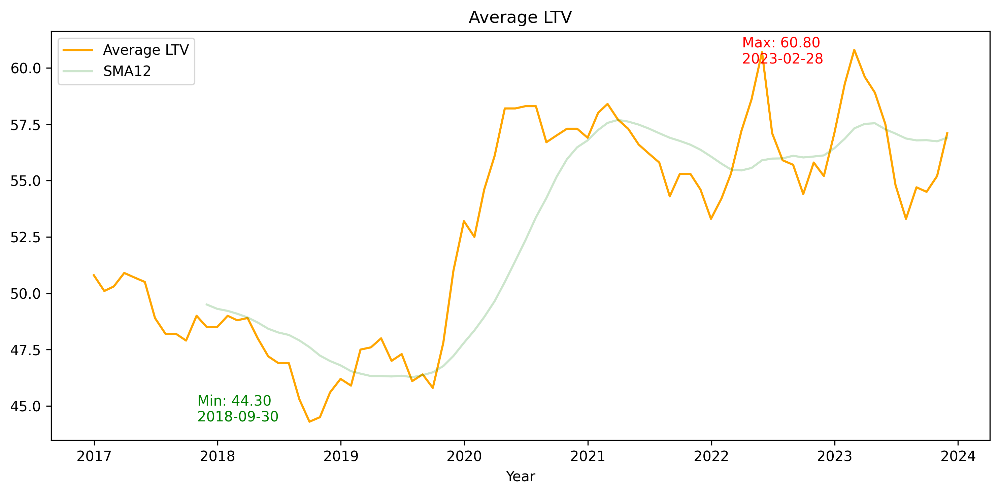

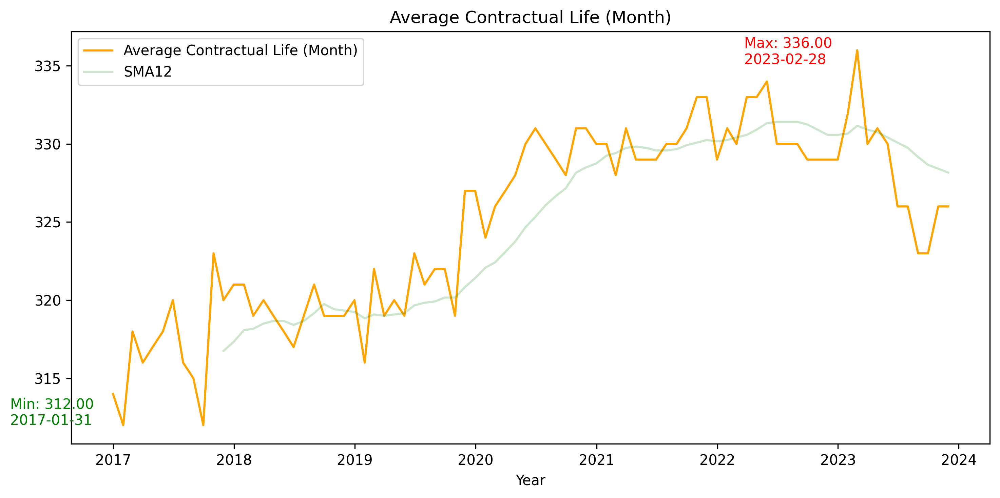

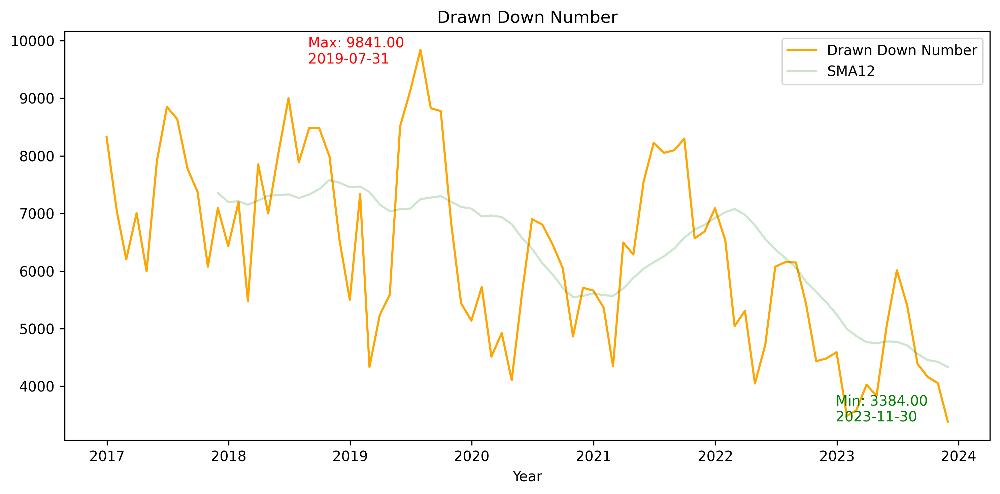

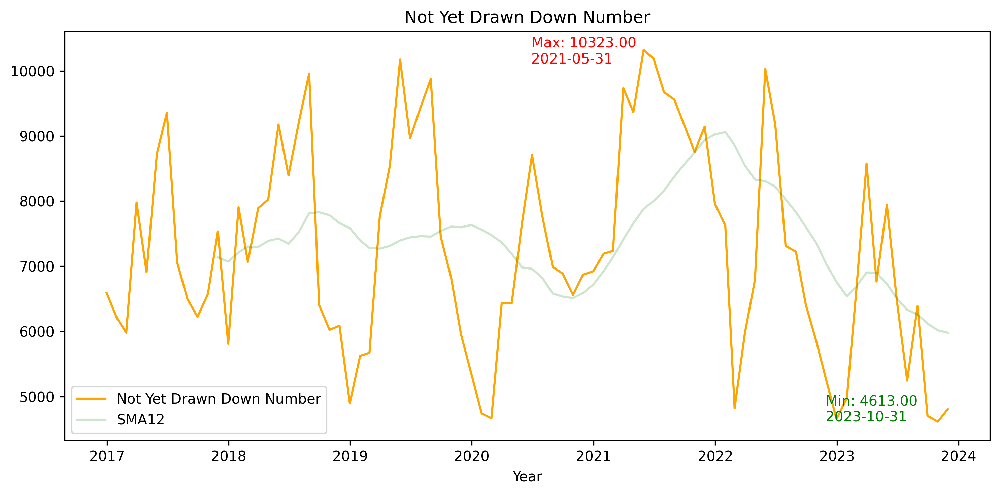

In [271]:
rolling_window = 12
this_df_new = df_new.dropna()
# Plot each column one by one
for col in cols_new:
    plt.figure(figsize=(10, 5), dpi=300)
    # plt.plot(this_df_new['Date'], pd.Series(this_df_new[col].mean(), index=this_df_new['Date']), alpha=0)
    plt.plot(this_df_new['Date'], this_df_new[col], c=color, label=col)
    plt.plot(this_df_new['Date'], this_df_new[col].rolling(rolling_window).mean(), color='green', alpha=0.2, label=f'SMA{rolling_window}')
    plt.xlabel('Year')
    this_col = col
    plt.title(this_col)


    # Get the maximum and minimum values
    max_val = this_df_new[col].max()
    min_val = this_df_new[col].min()
    max_date = this_df_new.loc[this_df_new[col].idxmax(), 'Date']
    min_date = this_df_new.loc[this_df_new[col].idxmin(), 'Date']
    plt.annotate(f'Max: {max_val:.2f}\n{timestamp2str(max_date)}', xy=(max_date, max_val), 
                 xytext=(-80, -10), textcoords='offset points', color='red')
    plt.annotate(f'Min: {min_val:.2f}\n{timestamp2str(min_date)}', xy=(min_date, min_val),
                xytext=(-80, 0), textcoords='offset points', color='green')

    plt.tight_layout()
    plt.legend()
    plt.show()

# 2, Segmentation Anlysis

Config

In [239]:
df_new_seg = df_new.loc[df_new['Year']>=2000]
df_new_seg

,Date,Year,Month,Quarter,Applications Number,Approved Number,Approved Value,Average LTV,Average Contractual Life (Month),Drawn Down Number,Drawn Down Value,Not Yet Drawn Down Number,Not Yet Drawn Down Value,Approved Percentage
43,2000-01-31,2000,1,1,NaN,8941,13120,NaN,NaN,7474,10506,6742,10123,NaN
44,2000-02-29,2000,2,1,NaN,7076,10294,NaN,NaN,6853,9961,5253,7612,NaN
45,2000-03-31,2000,3,1,NaN,10720,16224,NaN,NaN,7535,10780,8050,12185,NaN
46,2000-04-30,2000,4,2,NaN,8639,13049,NaN,NaN,7300,10095,6484,10005,NaN
47,2000-05-31,2000,5,2,NaN,8835,13304,NaN,NaN,6793,9727,6773,10380,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
325,2023-07-31,2023,7,3,8086.0,5754,28076,53.3,326.0,5401,26326,5243,25673,71.160030
326,2023-08-31,2023,8,3,8617.0,7042,35623,54.7,323.0,4389,20917,6385,32454,81.722177
327,2023-09-30,2023,9,3,8787.0,5130,25516,54.5,323.0,4164,20096,4702,23608,58.381700
328,2023-10-31,2023,10,4,5359.0,5016,24944,55.2,326.0,4054,20204,4613,22938,93.599552


## By Year

In [240]:
mean_values_yearly = df_new_seg.groupby('Year')[cols_new].mean()

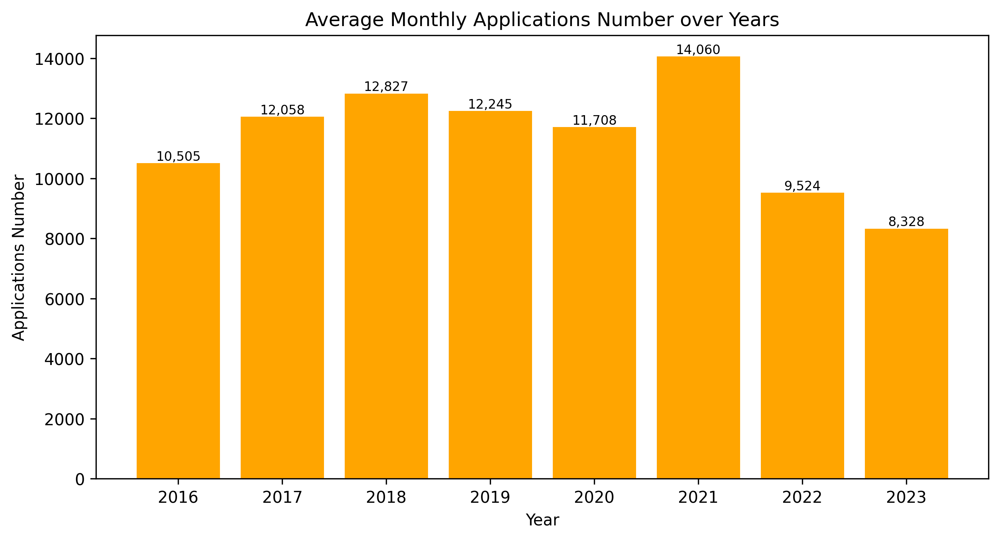

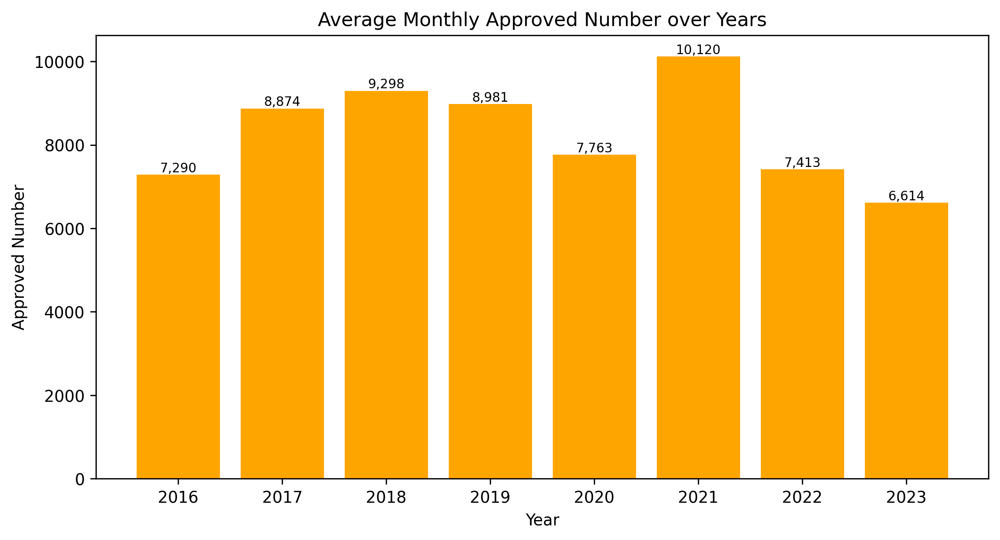

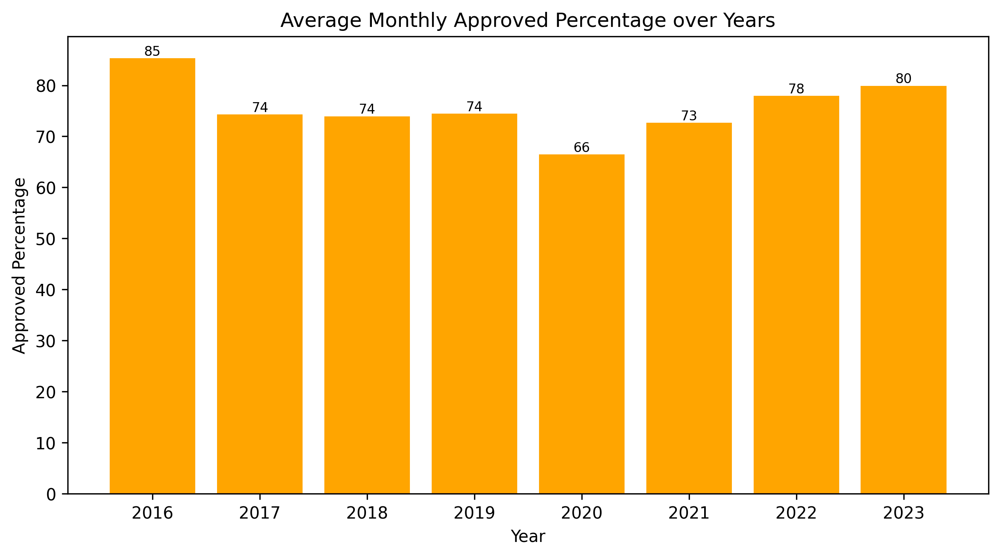

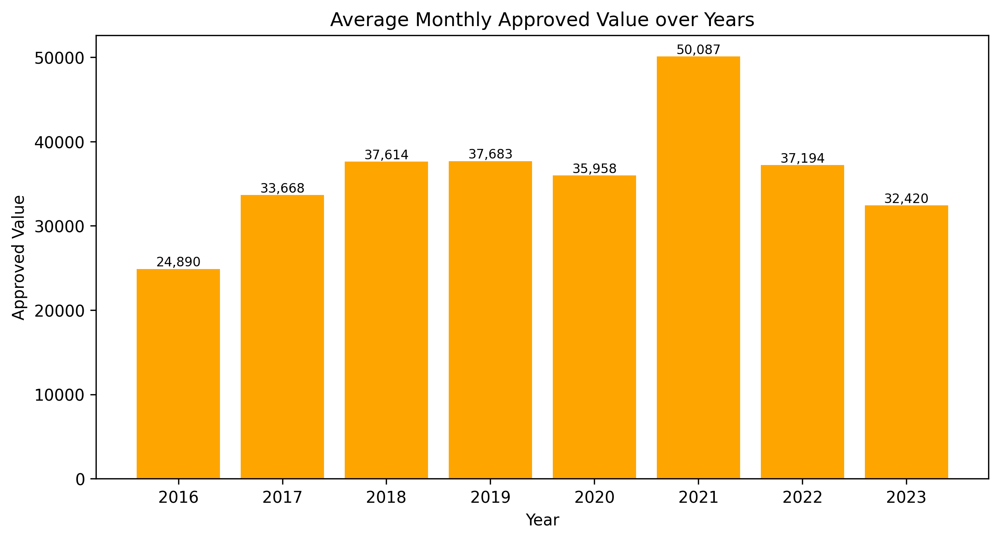

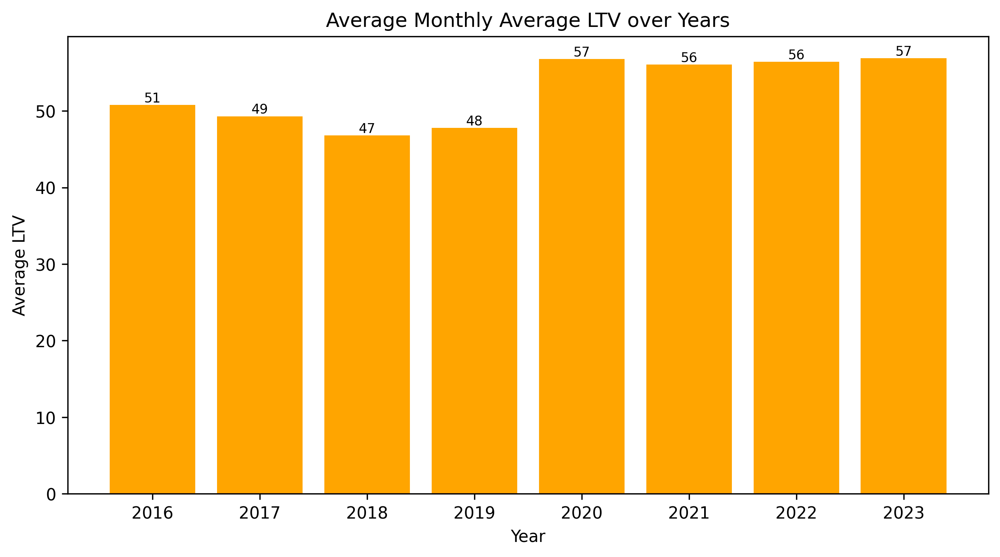

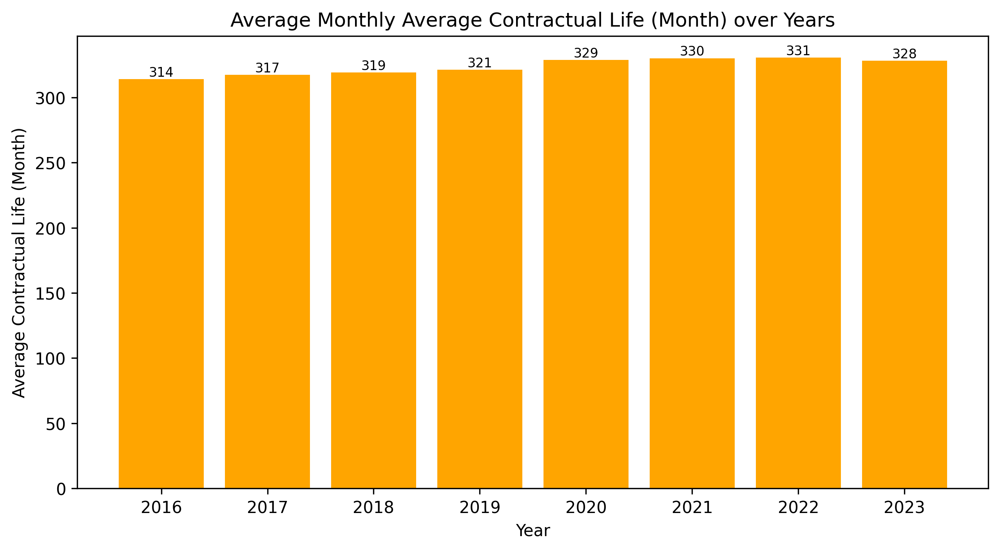

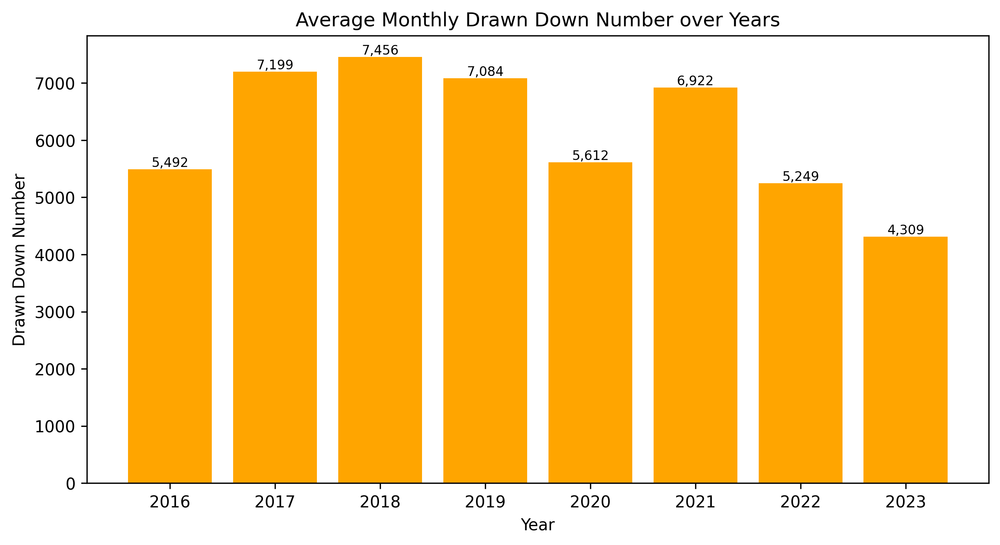

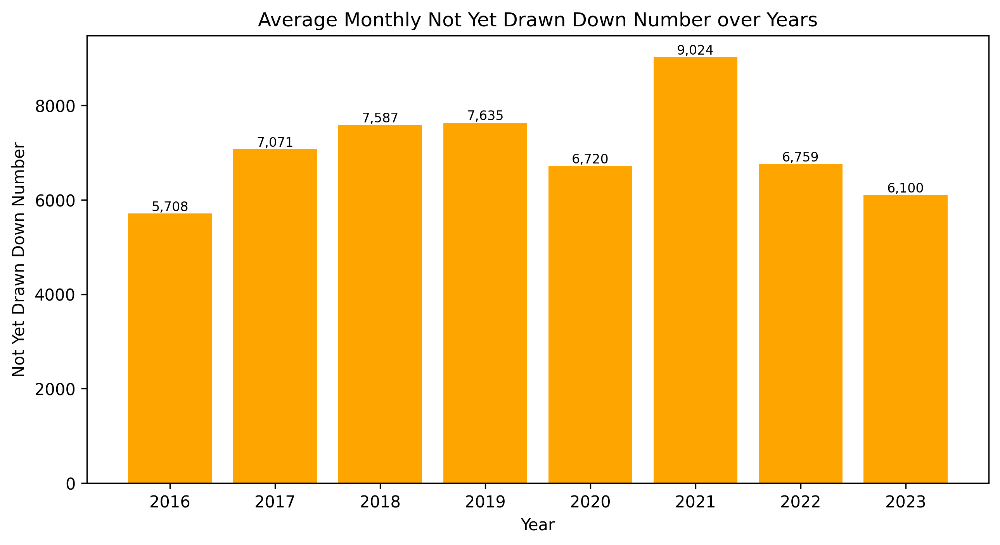

In [272]:
color = 'orange'
this = mean_values_yearly.dropna()
#Iterate over each column and plot the bar chart
for col in cols_new:
    fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
    not_null_idx = ~this[col].isna()
    bars = ax.bar(this.loc[not_null_idx].index, this[col].loc[not_null_idx], color=color)
    ax.set_xlabel('Year')
    ax.set_ylabel(col)
    this_col = col
    ax.set_title(f'Average Monthly {this_col} over Years')

    # Add number annotations to each bar
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:,.0f}', ha='center', va='bottom', fontsize=8)

    plt.show()

## By Quarter

In [243]:
# Group the DataFrame by 'Quarter' and calculate the mean of selected columns
mean_values_quarterly = df_new_seg.groupby('Quarter')[cols_new].mean()

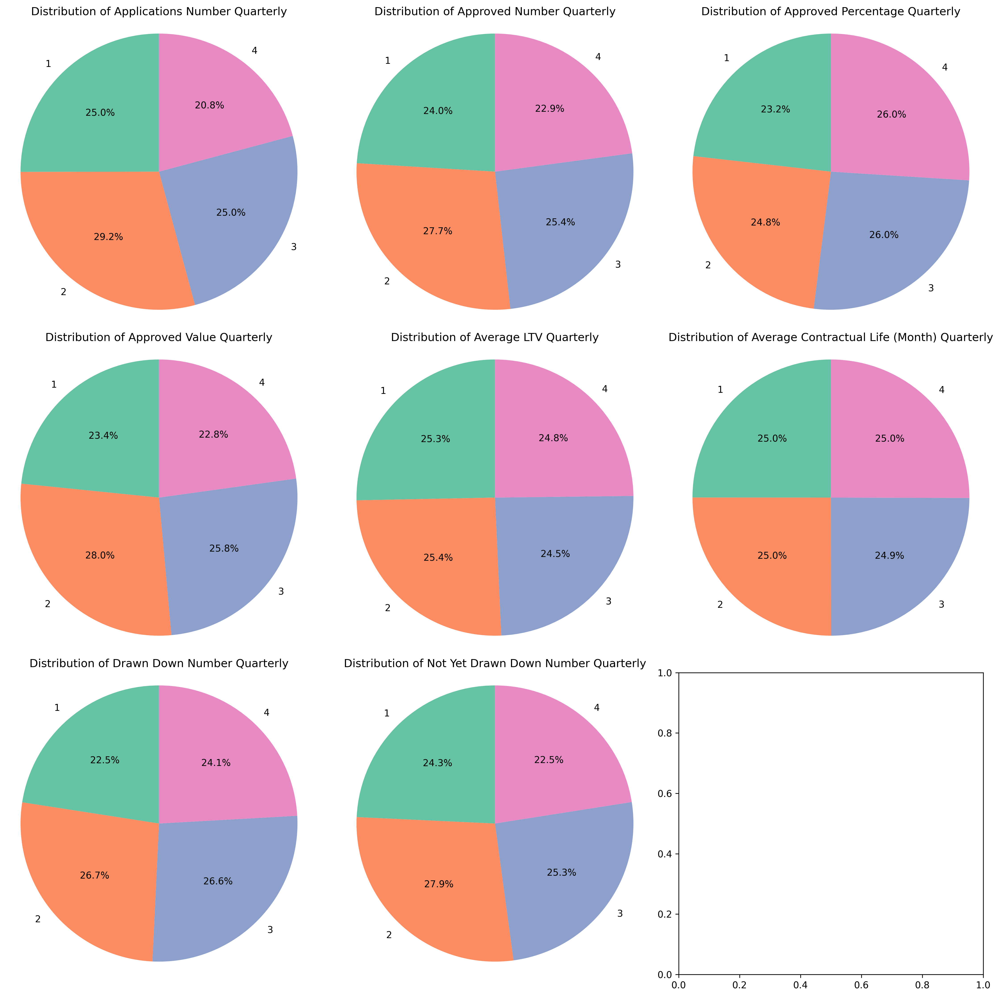

In [244]:
# Calculate the number of rows needed
num_rows = int(np.ceil(len(cols_new) / 3))

# Create subplots with the desired number of rows and columns
fig, axs = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows), dpi=300)

# Iterate over each column and plot the pie chart
for i, col in enumerate(cols_new):
    row = i // 3  # Calculate the row index
    col = i % 3  # Calculate the column index

    axs[row, col].pie(mean_values_quarterly.iloc[:, i], labels=mean_values_quarterly.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set2'))
    axs[row, col].axis('equal')
    axs[row, col].set_title(f'Distribution of {cols_new[i]} Quarterly')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()

In [245]:
9633.952381 * 1.4

13487.533333399999

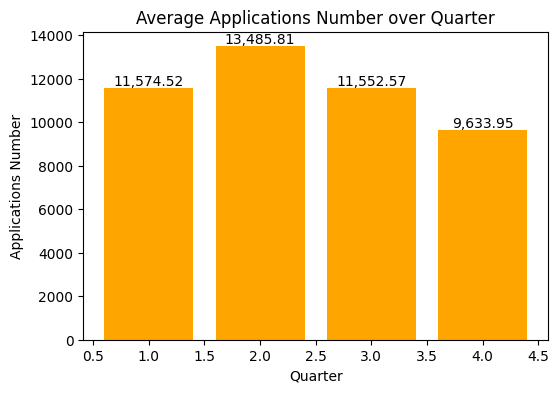

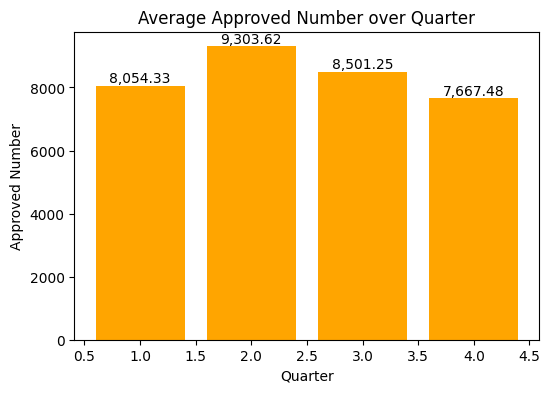

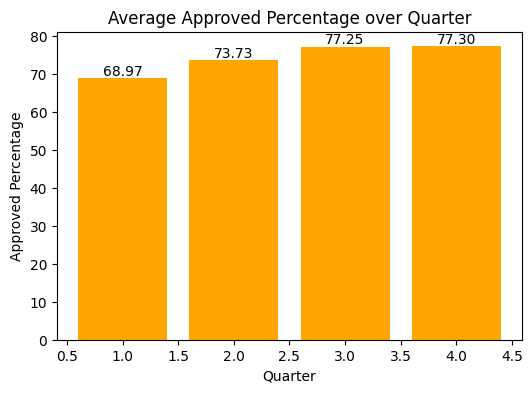

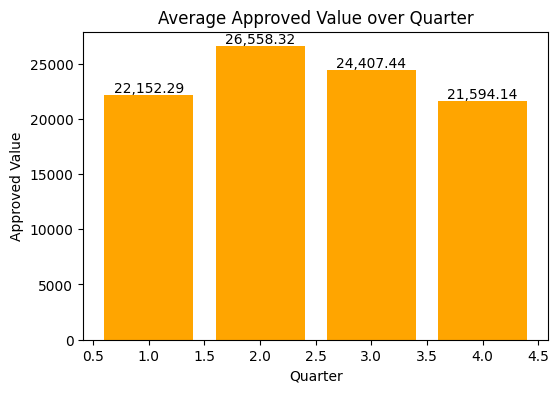

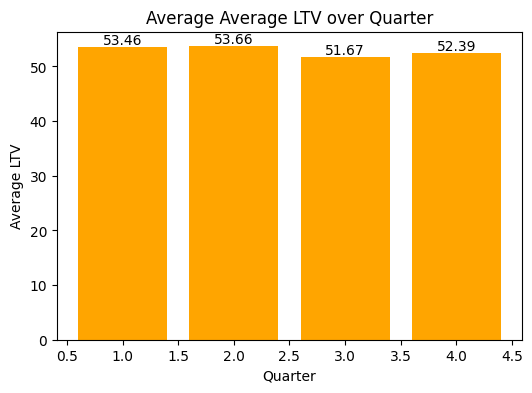

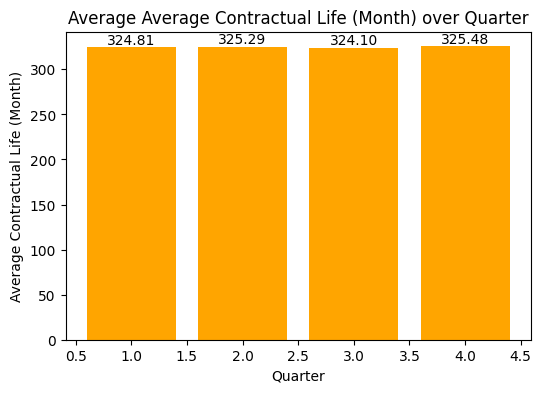

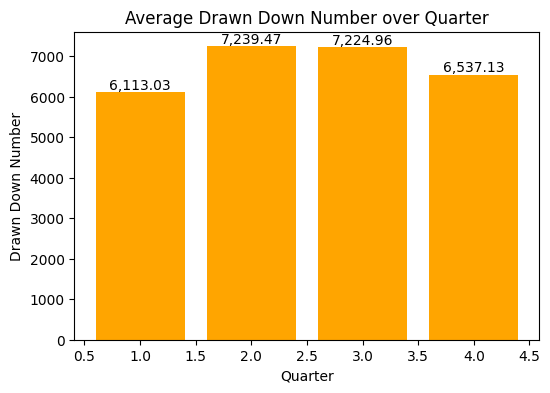

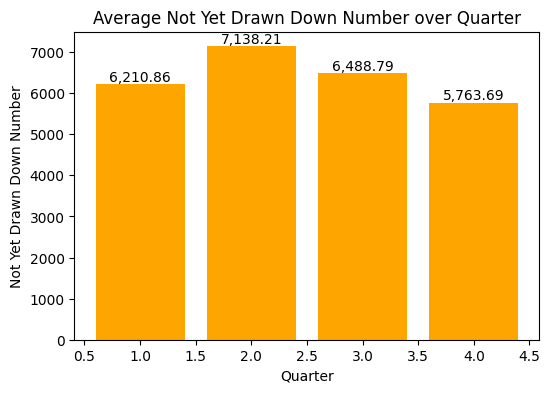

In [246]:
# Iterate over each column and plot the bar chart
for col in cols_new:
    fig, ax = plt.subplots(figsize=(6, 4))
    # fig, ax = plt.subplots(figsize=(6, 4), dpi=300)
    bars = ax.bar(mean_values_quarterly.index, mean_values_quarterly[col], color=color)
    ax.set_xlabel('Quarter')
    ax.set_ylabel(col)
    this_col = col
    ax.set_title(f'Average {this_col} over Quarter')

    # Add number annotations to each bar
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f"{height:,.2f}", ha='center', va='bottom')

    plt.show()

# 3, Correlation Analysis

## Data Preparation

Config & Reading

In [247]:
start_year_corr = 2000

dfs = {
  'hibor': pd.read_csv('Data (Clean)/CSV/IR HIBOR.csv').drop(columns='IDX'), 
  'deposits': pd.read_csv('Data (Clean)/CSV/Deposits (HKD&FC).csv').drop(columns='IDX'),
  'deposits_rate': pd.read_csv('Data (Clean)/CSV/IR HKD Deposit Rate.csv').drop(columns='IDX'),
  'unemployment': pd.read_csv('Data (Clean)/CSV/Labor Force.csv').drop(columns='IDX'),
}

Filtering

In [248]:
# Filter rows for all except df_hibor
for name, df in dfs.items():
  
    if name != 'unemployment':
        this_df = df.loc[df['Year']>=start_year_corr].copy()
        this_df['year_quarter'] = this_df['Year'].astype(str) + '_Q' + this_df['Quarter'].astype(str)
        dfs[name] = this_df


    else:
        this_df = df.loc[df['year_start']>=start_year_corr].copy()
        this_df['year_quarter'] = this_df['year_start'].astype(str) + '_Q' + this_df['quarter'].astype(str)
        dfs[name] = this_df

In [249]:
df_new['year_quarter'] = df_new['Year'].astype(str) + '_Q' + df_new['Quarter'].astype(str)

Grouping & Aggregation

In [250]:
dfs_grouped = {}
agg_method = 'mean'
groupby_key = 'year_quarter'
last_index = None

dfs_grouped['hibor'] = dfs['hibor'].groupby(groupby_key)['3-month'].agg(agg_method).iloc[:last_index].rename('HIBOR 3-month')
dfs_grouped['deposits'] = dfs['deposits'].groupby(groupby_key)['HKD'].agg(agg_method).iloc[:last_index].rename('HKD Deposits')
dfs_grouped['deposits_rate'] = dfs['deposits_rate'].groupby(groupby_key)['3-month'].agg(agg_method).iloc[:last_index].rename('Deposits Rate 3-month')
dfs_grouped['unemployment'] = dfs['unemployment'].groupby(groupby_key)['Unemployment Rate'].agg(agg_method)

In [251]:
df_new_grouped = df_new.groupby(groupby_key)[cols_new].agg(agg_method).iloc[:last_index]

Joining

In [252]:
join_key = ['Year', 'Month']
merged_df = dfs['hibor'][join_key + ['1-month']].merge(dfs['deposits_rate'][join_key + ['1-month']], on=join_key, suffixes=(' HIBOR', ' Deposit Rate'))
merged_df = merged_df.merge(dfs['deposits'][join_key + ['HKD']], on=join_key)
merged_df = merged_df.merge(df_new[join_key + cols_new], on=join_key)

merged_df['Date'] = pd.to_datetime(merged_df['Year'].astype(str) + '-' + merged_df['Month'].astype(str)) + pd.offsets.MonthEnd(1)
merged_df = merged_df.set_index('Date')
merged_df = merged_df.drop(['Year', 'Month'], axis=1)

df_grouped_monthly = merged_df
df_grouped_monthly.head()

,1-month HIBOR,1-month Deposit Rate,HKD,Applications Number,Approved Number,Approved Percentage,Approved Value,Average LTV,Average Contractual Life (Month),Drawn Down Number,Not Yet Drawn Down Number
Date,,,,,,,,,,,
2000-01-31,5.139137,3.84,1762487.775,NaN,8941,NaN,13120,NaN,NaN,7474,6742
2000-02-29,5.886044,4.21,1759730.930,NaN,7076,NaN,10294,NaN,NaN,6853,5253
2000-03-31,5.872962,4.46,1758813.452,NaN,10720,NaN,16224,NaN,NaN,7535,8050
2000-04-30,6.407039,4.99,1748685.206,NaN,8639,NaN,13049,NaN,NaN,7300,6484
2000-05-31,6.788690,5.41,1740939.301,NaN,8835,NaN,13304,NaN,NaN,6793,6773


In [253]:
df_grouped_quarterly = pd.concat([ds for ds in dfs_grouped.values()], axis=1)
df_grouped_quarterly = pd.concat([df_grouped_quarterly, df_new_grouped], axis=1)
df_grouped_quarterly.head()

,HIBOR 3-month,HKD Deposits,Deposits Rate 3-month,Unemployment Rate,Applications Number,Approved Number,Approved Percentage,Approved Value,Average LTV,Average Contractual Life (Month),Drawn Down Number,Not Yet Drawn Down Number
year_quarter,,,,,,,,,,,,
2000_Q1,5.982534,1.760344e+06,4.580000,5.5,NaN,8912.333333,NaN,13212.666667,NaN,NaN,7287.333333,6681.666667
2000_Q2,6.700764,1.757144e+06,5.380000,5.0,NaN,8753.333333,NaN,12905.000000,NaN,NaN,7043.333333,6744.000000
2000_Q3,6.244596,1.810556e+06,5.026667,4.9,NaN,8026.666667,NaN,11229.666667,NaN,NaN,7322.666667,5891.666667
2000_Q4,6.060968,1.836674e+06,4.913333,4.4,NaN,6007.333333,NaN,8407.333333,NaN,NaN,6126.333333,4003.333333
2001_Q1,5.156541,1.856363e+06,4.060000,4.4,NaN,6861.666667,NaN,9375.000000,NaN,NaN,5175.666667,5055.333333


## Correlation Heatmap

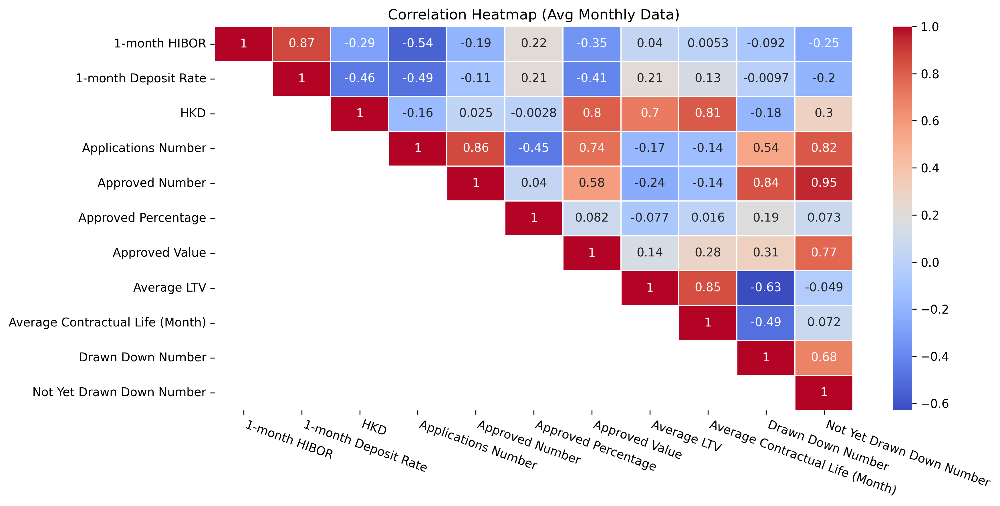

In [254]:
corr_method = 'pearson'
correlation_matrix_monthly = ((df_grouped_monthly - df_grouped_monthly.mean()) / df_grouped_monthly.std()).corr(method=corr_method)
mask = np.triu(np.ones_like(correlation_matrix_monthly, dtype=bool))


plt.figure(figsize=(12, 6), dpi=300)
sns.heatmap(correlation_matrix_monthly, annot=True, cmap='coolwarm', linewidths=0.5, mask=~mask)
plt.title('Correlation Heatmap (Avg Monthly Data)')
plt.xticks(rotation=-20, ha='left')
plt.tight_layout()
plt.show()

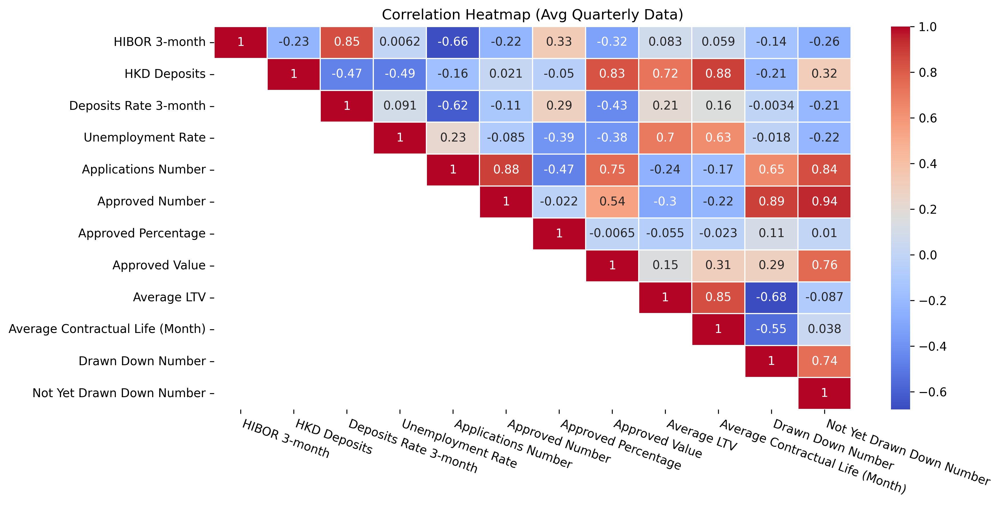

In [255]:
corr_method = 'pearson'
correlation_matrix_quarterly = ((df_grouped_quarterly - df_grouped_quarterly.mean()) / df_grouped_quarterly.std()).corr(method=corr_method)
mask = np.triu(np.ones_like(correlation_matrix_quarterly, dtype=bool))

plt.figure(figsize=(12, 6), dpi=300)
sns.heatmap(correlation_matrix_quarterly, annot=True, cmap='coolwarm', linewidths=0.5, mask=~mask)
plt.title('Correlation Heatmap (Avg Quarterly Data)')
plt.xticks(rotation=-20, ha='left')
plt.tight_layout()
plt.show()

## Regression Plot

IR vs Application

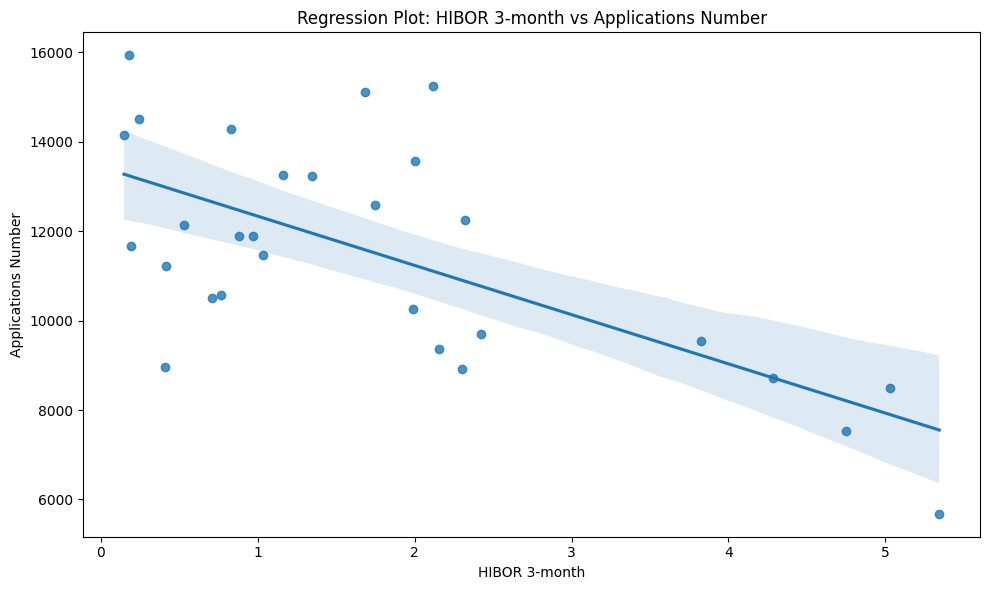

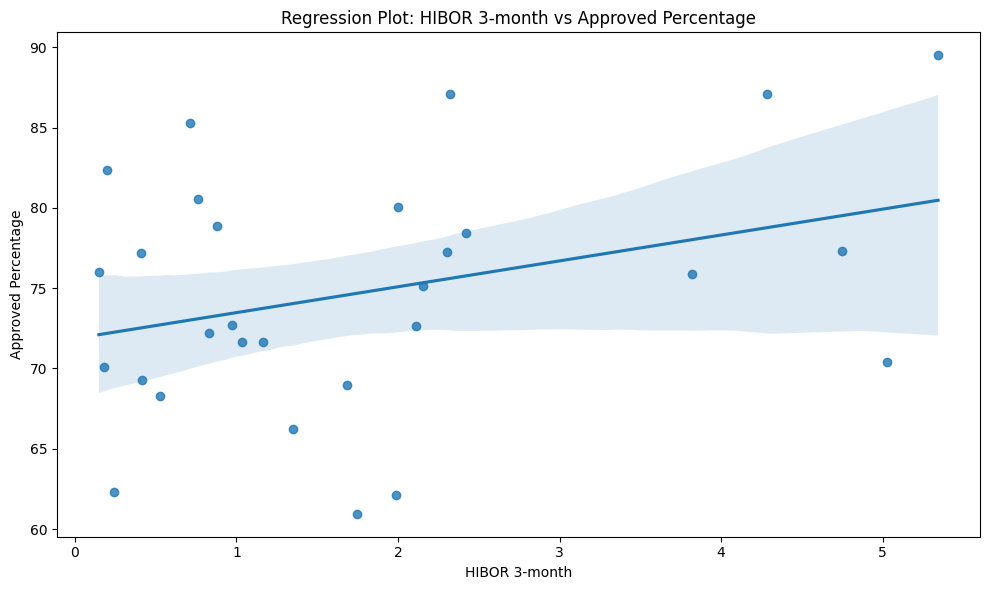

In [256]:
x = 'HIBOR 3-month'
df_grouped = df_grouped_quarterly
# x = '1-month HIBOR'
# df_grouped = df_grouped_monthly

y_values = ['Applications Number', 'Approved Percentage']

for i, y in enumerate(y_values):

  fig = plt.figure(figsize=(10,6))

  ax = fig.add_subplot(111)  
  ax.set_title(f'Regression Plot: {x} vs {y}')
  
  sns.regplot(data=df_grouped, x=x, y=y, ax=ax)
  
  ax.set_xlabel(x)
  ax.set_ylabel(y)

  plt.tight_layout()
  plt.show()

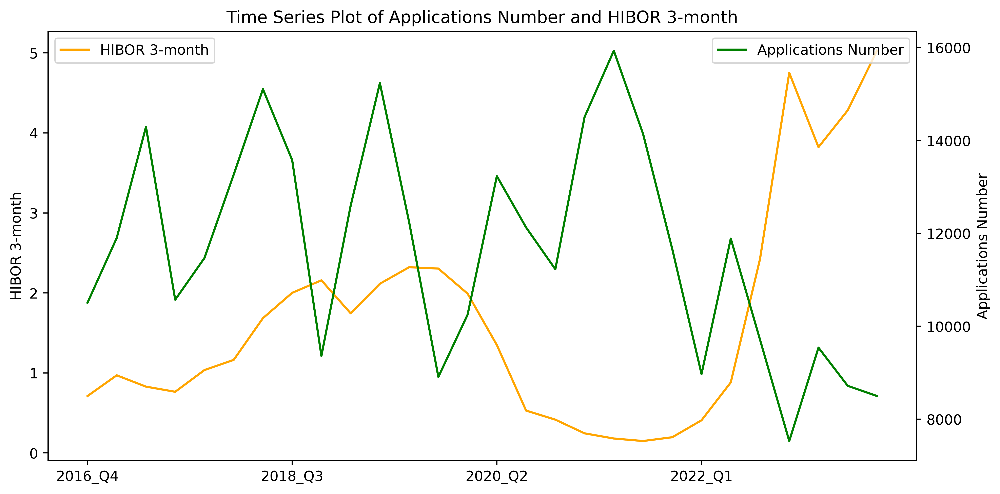

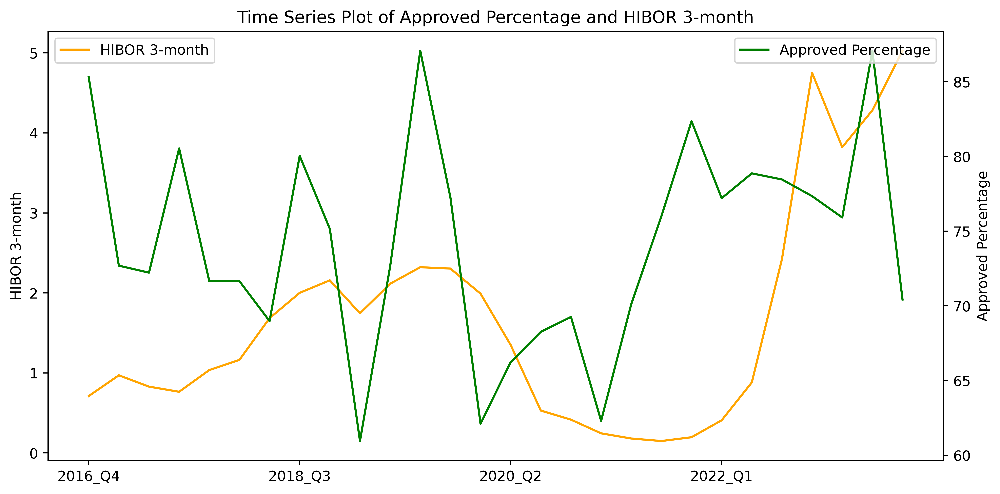

In [257]:
x = 'HIBOR 3-month'
df_grouped = df_grouped_quarterly.dropna()

# x = '1-month HIBOR'
# df_grouped = df_grouped_monthly.dropna()

variables = [('Applications Number', x), ('Approved Percentage', x)]

for i, (var1, var2) in enumerate(variables):
    fig = plt.figure(figsize=(10, 5), dpi=500)
    ax = fig.add_subplot(111)
    
    ax.plot(df_grouped[var2], color='orange', label=var2)
    ax.set_ylabel(var2)
    ax.set_title(f'Time Series Plot of {var1} and {var2}')
    ax.legend(loc=2)
    
    ax2 = ax.twinx()
    ax2.plot(df_grouped[var1], color='green', label=var1)
    ax2.set_ylabel(var1)
    ax2.legend(loc=1)

    plt.xticks(range(0, len(df_grouped.index), 7))
    plt.tight_layout()
    plt.show()

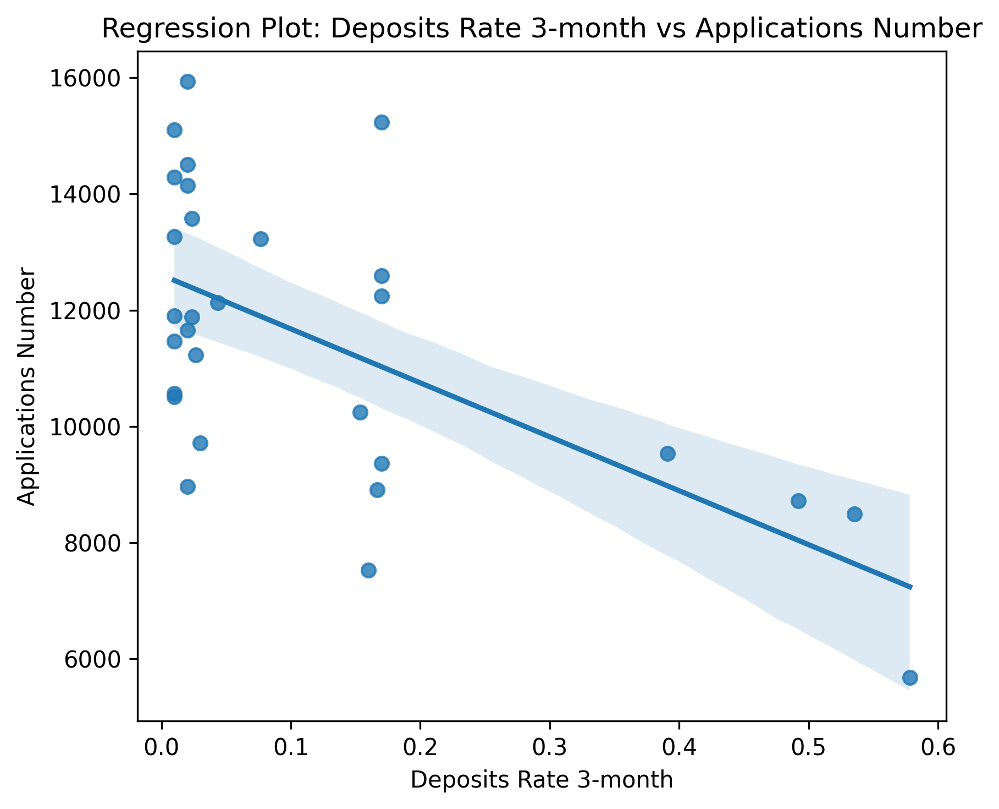

In [258]:
fig = plt.figure(figsize=(6, 5), dpi=300)
axs = fig.add_subplot(111)

y = 'Applications Number'
x = 'Deposits Rate 3-month'

axs.set_title(f'Regression Plot: {x} vs {y}')
sns.regplot(data=df_grouped_quarterly, x=x, y=y, ax=axs)
axs.set_xlabel(x)
axs.set_ylabel(y)

plt.tight_layout()
plt.show()

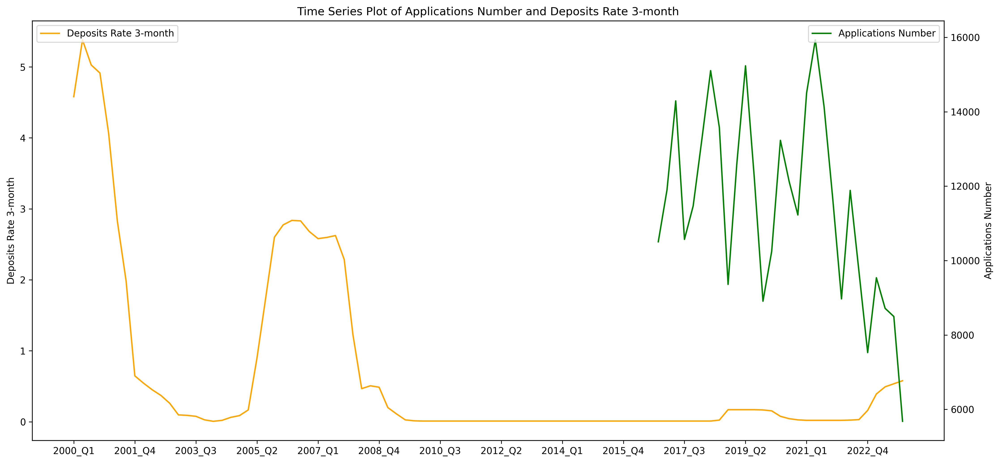

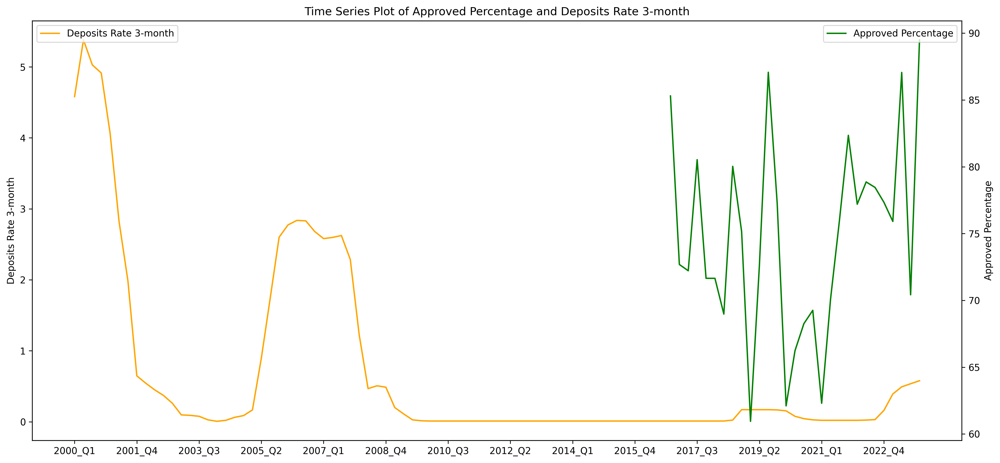

In [259]:
variables = [('Applications Number', 'Deposits Rate 3-month'), ('Approved Percentage', 'Deposits Rate 3-month')]

for i, (var1, var2) in enumerate(variables):
    fig = plt.figure(figsize=(15, 7), dpi=300)
    ax = fig.add_subplot(111)
    
    ax.plot(df_grouped_quarterly[var2], color='orange', label=var2)
    ax.set_ylabel(var2)
    ax.set_title(f'Time Series Plot of {var1} and {var2}')
    ax.legend(loc=2)
    
    ax2 = ax.twinx()
    ax2.plot(df_grouped_quarterly[var1], color='green', label=var1)
    ax2.set_ylabel(var1)
    ax2.legend(loc=1)

    plt.xticks(range(0, len(df_grouped_quarterly.index), 7))
    plt.tight_layout()
    plt.show()

Unemployment Rate vs LTV&Tenor

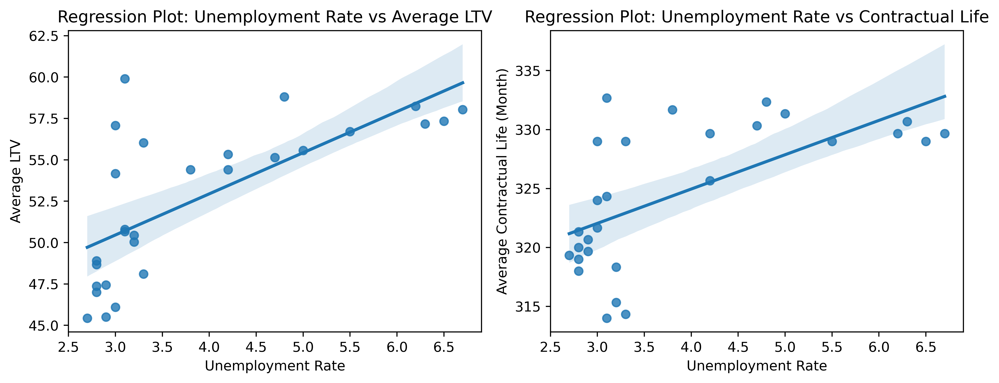

In [260]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4), dpi=500)

sns.regplot(data=df_grouped_quarterly, 
            x='Unemployment Rate', 
            y='Average LTV',
            ax=ax[0])
ax[0].set_title('Regression Plot: Unemployment Rate vs Average LTV')

sns.regplot(data=df_grouped_quarterly,  
            x='Unemployment Rate',
            y='Average Contractual Life (Month)', 
            ax=ax[1])            
ax[1].set_title('Regression Plot: Unemployment Rate vs Contractual Life')

fig.tight_layout()
plt.show()

In [261]:
df_grouped_quarterly

,HIBOR 3-month,HKD Deposits,Deposits Rate 3-month,Unemployment Rate,Applications Number,Approved Number,Approved Percentage,Approved Value,Average LTV,Average Contractual Life (Month),Drawn Down Number,Not Yet Drawn Down Number
year_quarter,,,,,,,,,,,,
2000_Q1,5.982534,1.760344e+06,4.580000,5.5,NaN,8912.333333,NaN,13212.666667,NaN,NaN,7287.333333,6681.666667
2000_Q2,6.700764,1.757144e+06,5.380000,5.0,NaN,8753.333333,NaN,12905.000000,NaN,NaN,7043.333333,6744.000000
2000_Q3,6.244596,1.810556e+06,5.026667,4.9,NaN,8026.666667,NaN,11229.666667,NaN,NaN,7322.666667,5891.666667
2000_Q4,6.060968,1.836674e+06,4.913333,4.4,NaN,6007.333333,NaN,8407.333333,NaN,NaN,6126.333333,4003.333333
2001_Q1,5.156541,1.856363e+06,4.060000,4.4,NaN,6861.666667,NaN,9375.000000,NaN,NaN,5175.666667,5055.333333
...,...,...,...,...,...,...,...,...,...,...,...,...
2022_Q4,4.751082,7.373154e+06,0.160000,3.3,7527.333333,5812.000000,77.341227,28757.000000,56.033333,329.000000,4502.666667,5251.666667
2023_Q1,3.821965,7.626217e+06,0.391125,3.1,9538.000000,7295.666667,75.911617,35203.666667,59.900000,332.666667,3696.666667,6721.666667
2023_Q2,4.282646,7.599599e+06,0.491875,3.0,8716.000000,7600.666667,87.060804,37440.000000,57.066667,329.000000,4972.000000,7062.000000


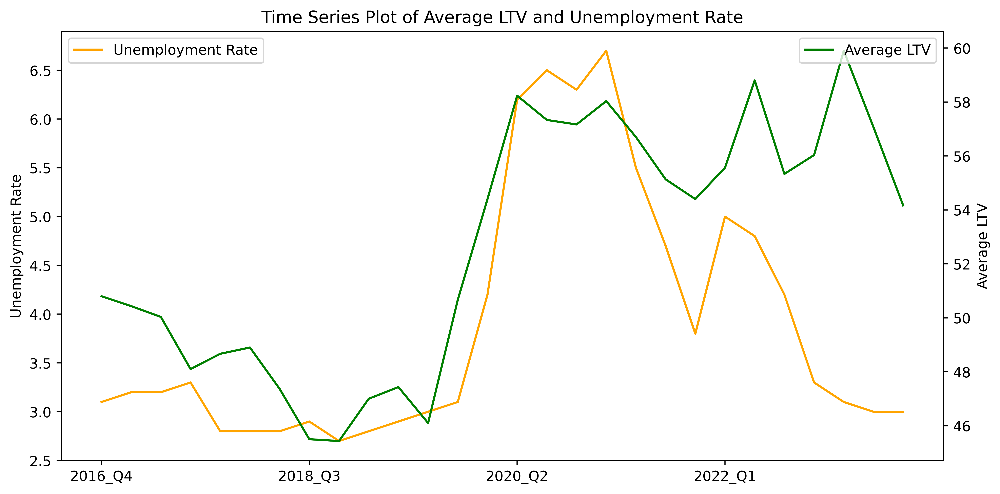

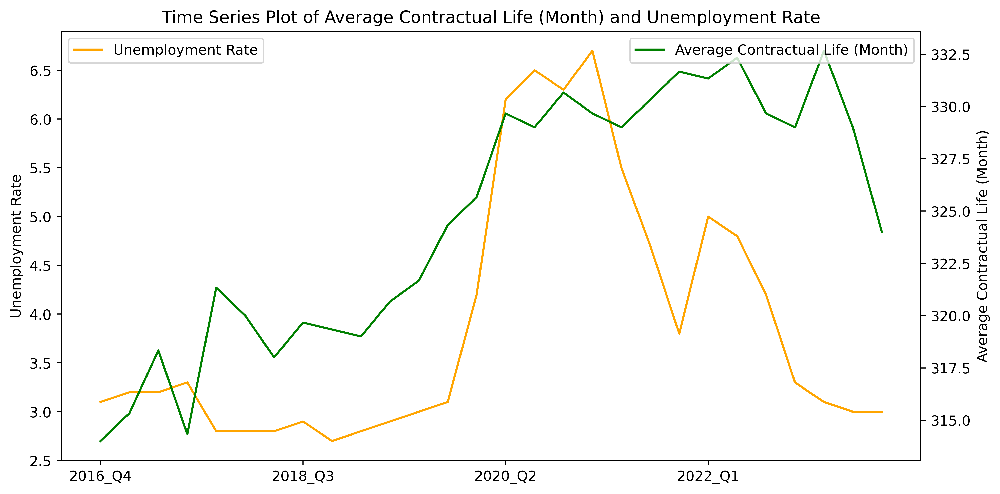

In [262]:
this = df_grouped_quarterly.dropna()
variables = [('Average LTV', 'Unemployment Rate'), ('Average Contractual Life (Month)', 'Unemployment Rate')]

for i, (var1, var2) in enumerate(variables):
    fig = plt.figure(figsize=(10, 5), dpi=500)
    ax = fig.add_subplot(111)
    
    ax.plot(this[var2], color='orange', label=var2)
    ax.set_ylabel(var2)
    ax.set_title(f'Time Series Plot of {var1} and {var2}')
    ax.legend(loc=2)
    
    ax2 = ax.twinx()
    ax2.plot(this[var1], color='green', label=var1)
    ax2.set_ylabel(var1)
    ax2.legend(loc=1)

    plt.xticks(range(0, len(this.index), 7))
    plt.tight_layout()
    plt.show()

HKD Deposits vs LTV&Tenors

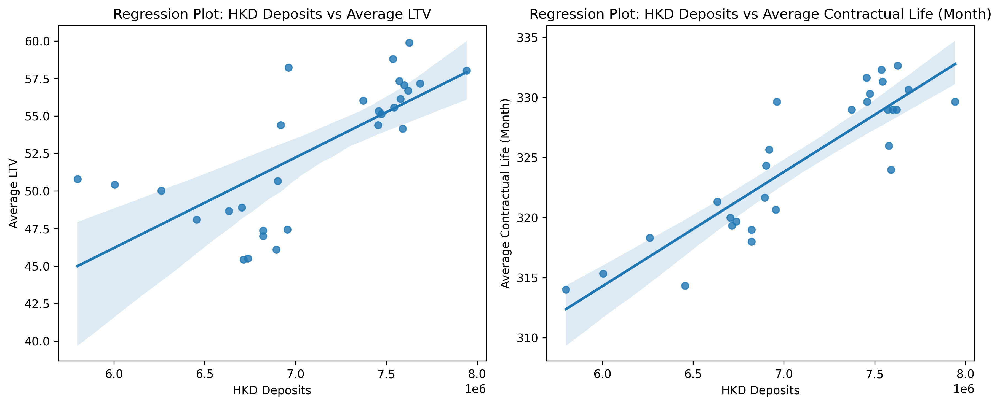

In [263]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5), dpi=300)
y_values = ['Average LTV', 'Average Contractual Life (Month)']
x = 'HKD Deposits'

for i, ax in enumerate(axs):
    y = y_values[i]
    ax.set_title(f'Regression Plot: {x} vs {y}')
    sns.regplot(data=df_grouped_quarterly, x=x, y=y, ax=ax)
    ax.set_xlabel(x)
    ax.set_ylabel(y)

plt.tight_layout()
plt.show()

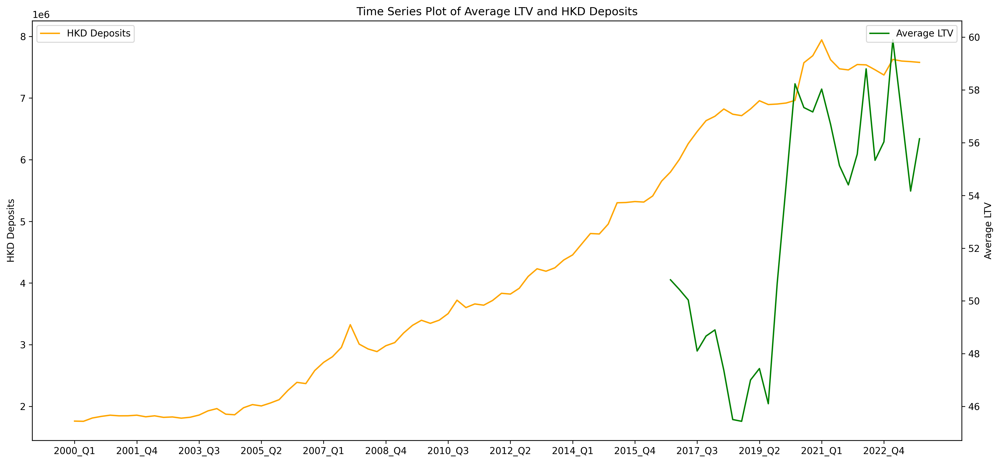

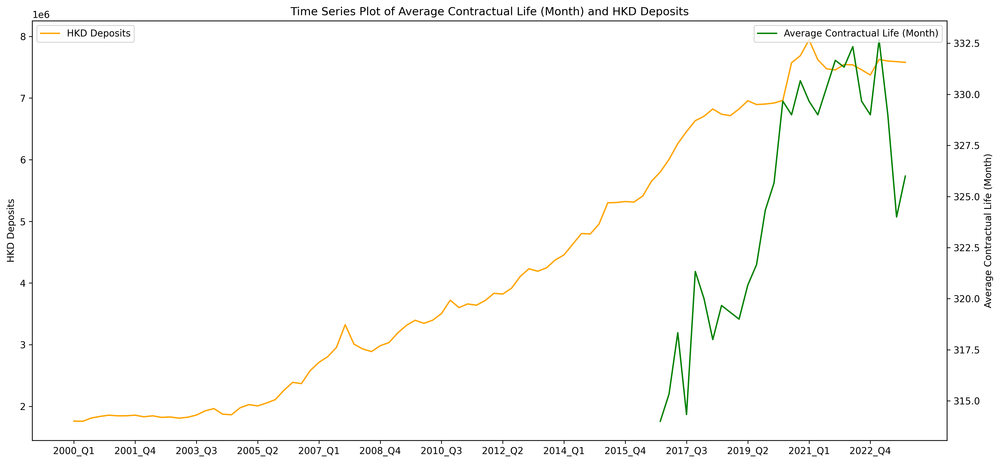

In [264]:
b = 'HKD Deposits'
variables = [('Average LTV', b), ('Average Contractual Life (Month)', b)]

for i, (var1, var2) in enumerate(variables):
    fig = plt.figure(figsize=(15, 7), dpi=300)
    ax = fig.add_subplot(111)
    
    ax.plot(df_grouped_quarterly[var2], color='orange', label=var2)
    ax.set_ylabel(var2)
    ax.set_title(f'Time Series Plot of {var1} and {var2}')
    ax.legend(loc=2)
    
    ax2 = ax.twinx()
    ax2.plot(df_grouped_quarterly[var1], color='green', label=var1)
    ax2.set_ylabel(var1)
    ax2.legend(loc=1)

    plt.xticks(range(0, len(df_grouped_quarterly.index), 7))
    plt.tight_layout()
    plt.show()